<a href="https://colab.research.google.com/github/Irina-Bogdanova-bioinformatician/Research_project_BIOINF_2023/blob/dev/Global_gene_expression_of_NSCLC_TIL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Global gene expression of NSCLC TIL

 **Objective**: reproduction of  the study of the transcription profile of tumor-infiltrating lymphocytes (TIL) described in the article ‘Transcriptional programs of neoantigen-specific TIL in anti-PD-1-treated lung cancers' (doi: 10.1038/s41586-021-03752-4 ).
 
 https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8338555/

**Tasks**:
- Downloading preprocessed data from GEO (single-cell RNA-seq) and annotations to them, understanding the data structure (3 count matrix files)
- Samples selection 
- QC (genes number, mitochondrial and ribosomal genes counts, number of cells based filtration)
- Searching for variable genes, PCA, conducting UMAP
- Identification and annotation of T-cell clusters by expression of marker genes, results visualization
- TIL expression profile assessment


### Abstract of the article

PD-1 blockade unleashes CD8 T cells, including those specific for mutation-associated neoantigens (MANA), but factors in the tumour microenvironment can inhibit these T cell responses. Single-cell transcriptomics have revealed global T cell dysfunction programs in tumour-infiltrating lymphocytes (TIL). However, the majority of TIL do not recognize tumour antigens, and little is known about transcriptional programs of MANA-specific TIL. Here, we identify MANA-specific T cell clones using the MANA functional expansion of specific T cells assay in neoadjuvant anti-PD-1-treated non-small cell lung cancers (NSCLC). We use their T cell receptors as a ‘barcode’ to track and analyse their transcriptional programs in the tumour microenvironment using coupled single-cell RNA sequencing and T cell receptor sequencing. We find both MANA- and virus-specific clones in TIL, regardless of response, and MANA-, influenza- and Epstein–Barr virus-specific TIL each have unique transcriptional programs. Despite exposure to cognate antigen, MANA-specific TIL express an incompletely activated cytolytic program. MANA-specific CD8 T cells have hallmark transcriptional programs of tissue-resident memory (TRM) cells, but low levels of interleukin-7 receptor (IL-7R) and are functionally less responsive to interleukin-7 (IL-7) compared with influenza-specific TRM cells. Compared with those from responding tumours, MANA-specific clones from non-responding tumours express T cell receptors with markedly lower ligand-dependent signalling, are largely confined to HOBIThigh TRM subsets, and coordinately upregulate checkpoints, killer inhibitory receptors and inhibitors of T cell activation. These findings provide important insights for overcoming resistance to PD-1 blockade.

Bulk TCRVβ sequencing data generated by Adaptive Biotechnologies are available in the Adaptive Biotechnologies ImmuneACCESS repository under DOI 10.21417/JC2021N, at https://clients.adaptivebiotech.com/pub/caushi-2021-n. Bulk TCRVβ raw and processed sequencing data generated by the Sidney Kimmel Comprehensive Cancer Center FTIC are available in the Gene Expression Omnibus with accession number GSE173351. Raw scRNA-seq–TCR-seq data reported in this paper are available in the European Genome-phenome Archive under controlled access with accession number EGAS00001005343. Owing to the personal, sensitive and inherently identifying nature of raw genomic data, access to raw RNA-seq–TCR-seq data is controlled and full instructions to apply for data access can be found at https://ega-archive.org/access/data-access. Approvals will be granted immediately upon confirmation that all requirements are met. Processed and de-identified single-cell data are available in the Gene Expression Omnibus with accession number GSE176022.

Scripts to reproduce the analyses used in this study are available at https://github.com/BKI-immuno/neoantigen-specific-T-cells-NSCLC.

## Raw data downloading and unpacking

**Data and Context**

Platform: Illumina NovaSeq 6000 (Homo sapiens)

GEO accession: GSE173351 (raw and processed sequencing data generated by the Sidney Kimmel Comprehensive Cancer Center FTIC).
Download data from https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE173351 as tar file (Processed data provided as supplementary file) - both single-cell RNA-seq and bulk TCR-seq.

Separately sсRNA-seq and bulk TCR-seq:
- single-cell RNA-seq https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE176021
- bulk TCR-seq https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE176022

**Single-cell data preprocessing (data that we downloaded):**
Cell Ranger v3.1.0 was used to demultiplex the FASTQ reads, align them to the GRCh38 human transcriptome, and extract their cell and unique molecular identifier (UMI) barcodes. The output of this pipeline is a digital gene expression (DGE) matrix for each sample, which records the number of UMIs for each gene that are associated with each cell barcode. 

Cell Ranger is a set of analysis pipelines that process Chromium single cell data to align reads, generate feature-barcode matrices, perform clustering and other secondary analysis, and more (see list of example workflows and supported libraries). Cell Ranger includes five pipelines relevant to the 3' Single Cell Gene Expression Solutions and related products (https://support.10xgenomics.com/single-cell-gene-expression/software/pipelines/latest/what-is-cell-ranger)



**Data downloading and extraction**

Work with single-cell RNA-seq

In [ ]:
!wget https://ftp.ncbi.nlm.nih.gov/geo/series/GSE176nnn/GSE176021/suppl/GSE176021_RAW.tar

--2023-05-22 08:02:38--  https://ftp.ncbi.nlm.nih.gov/geo/series/GSE176nnn/GSE176021/suppl/GSE176021_RAW.tar
Resolving ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)... 130.14.250.11, 130.14.250.13, 2607:f220:41e:250::11, ...
Connecting to ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)|130.14.250.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4350484480 (4.1G) [application/x-tar]
Saving to: ‘GSE176021_RAW.tar’

GSE176021_RAW.tar   100%[===================>]   4.05G  44.4MB/s    in 96s     

2023-05-22 08:04:14 (43.4 MB/s) - ‘GSE176021_RAW.tar’ saved [4350484480/4350484480]



In [ ]:
!mkdir data

In [ ]:
!tar -xf GSE176021_RAW.tar

In [ ]:
!mv GSM* data/

In [ ]:
!for file in data/*.gz; do gunzip $file; done

In [ ]:
!for file in data/*.tar; do tar -xf $file -C data/; done


## Global gene expression of NSCLC TIL

**Samples selection**

In [ ]:
!mkdir selected_samples

In [ ]:
import os
import shutil

Take the following samples for an  analysis:
- MD01-019 (non-MPRs)
- NY016-007 (non-MPRs)
- NY016-014 (non-MPRs)
- MD043-008 (MPR)
- MD043-003 (MPR)
- MD01-005 (MPR)

WHY THESE ONES: several patients with and without MPR were randomly selected.

“Major pathologic response” (MPR, ≤10% residual viable tumor in resected lung and lymph node tissue) is well suited to be adopted as a surrogate of survival in NSCLCs treated with neoadjuvant chemotherapy. MPR reliably and significantly associates with survival in retrospective and prospective studies, reflects treatment-specific anti-tumor activity, manifests the magnitude of the impact of treatment on survival, is applicable to all stages of NSCLCs, is independent of pre-treatment staging accuracy, and can be determined using relatively simple and inexpensive methods (source: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4734624/).

In [ ]:
samples = ["MD01-019", "MD043-003", "MD043-008", "MD01-005", "NY016-007", "NY016-014"]
subdirs = set(os.listdir('data/'))

# take samples from 
for sub in samples:
    print(sub)
    dirs = list(filter (lambda x: sub in x and ".vdj" not in x and ".tar" not in x and ("normal" in x or "tumor" in x) and not x.startswith("._"), subdirs))
    print(dirs)
    for dir in dirs:
        s = os.path.join("data/", dir)
        d = os.path.join("selected_samples", dir)
        shutil.copytree(s, d, dirs_exist_ok=True)


MD01-019
['MD01-019_tumor_7', 'MD01-019_tumor_25', 'MD01-019_tumor_13', 'MD01-019_tumor_8', 'MD01-019_tumor_17', 'MD01-019_tumor_1', 'MD01-019_normal_1', 'MD01-019_tumor_10', 'MD01-019_tumor_11', 'MD01-019_normal_2', 'MD01-019_tumor_6', 'MD01-019_tumor_15', 'MD01-019_tumor_3']
MD043-003
['MD043-003_tumor_5', 'MD043-003_tumor_1', 'MD043-003_tumor_3', 'MD043-003_tumor_4', 'MD043-003_tumor_2', 'MD043-003_normal_2']
MD043-008
['MD043-008_normal_1', 'MD043-008_tumor_1']
MD01-005
['MD01-005_tumor_6', 'MD01-005_normal_1', 'MD01-005_tumor_9', 'MD01-005_tumor_3', 'MD01-005_normal_2', 'MD01-005_normal_5', 'MD01-005_tumor_8', 'MD01-005_normal_4', 'MD01-005_normal_3', 'MD01-005_tumor_2', 'MD01-005_tumor_5', 'MD01-005_tumor_4', 'MD01-005_tumor_7']
NY016-007
['NY016-007_tumor_3', 'NY016-007_normal_1', 'NY016-007_tumor_1', 'NY016-007_tumor_2']
NY016-014
['NY016-014_tumor_3', 'NY016-014_tumor_2', 'NY016-014_tumor_1']


## Quality control

For QC use Scanpy (Seurat alternative in R).

In [ ]:
!pip install scanpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 31.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.0/103.0 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 10.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 63.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.5/63.5 kB 7.6 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82816 sha256=7d98f89a4d15581cbd0ceff65d97c14ed2b4d80ac7535e398c46bd446a1fea38
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8026 sha256=9f82fa9ceaa57c71c

From the article:

The quality of cells was then assessed based on (1) the number of genes detected per cell and (2) the proportion of mitochondrial gene/ribosomal gene counts. Low-quality cells were filtered if the number of detected genes was below 250 or above 3× the median absolute deviation away from the median gene number of all cells. Cells were filtered out if the proportion of mitochondrial gene counts was higher than 10% or the proportion of ribosomal genes was less than 10%. For single-cell VDJ sequencing, only cells with full-length sequences were retained. Dissociation/stress associated genes, mitochondrial genes (annotated with the prefix ‘MT-’), high abundance lincRNA genes, genes linked with poorly supported transcriptional models (annotated with the prefix ‘RP-’) and TCR (TR) genes (TRA/TRB/TRD/TRG, to avoid clonotype bias) were removed from further analysis. In addition, genes that were expressed in less than five cells were excluded.

In [ ]:
!mkdir results

In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc

In [ ]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.22.4 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.13.5 pynndescent==0.5.10


Read in the count matrix into an AnnData object, which holds many slots for annotations and different representations of the data. It also comes with its own HDF5-based file format: .h5ad.

AnnData - an annotated data matrix

https://anndata.readthedocs.io/en/stable/generated/anndata.AnnData.html#anndata.AnnData

In [ ]:
selected = set(os.listdir('selected_samples/'))

In [ ]:
selected

{'MD01-005_normal_1',
 'MD01-005_normal_2',
 'MD01-005_normal_3',
 'MD01-005_normal_4',
 'MD01-005_normal_5',
 'MD01-005_tumor_2',
 'MD01-005_tumor_3',
 'MD01-005_tumor_4',
 'MD01-005_tumor_5',
 'MD01-005_tumor_6',
 'MD01-005_tumor_7',
 'MD01-005_tumor_8',
 'MD01-005_tumor_9',
 'MD01-019_normal_1',
 'MD01-019_normal_2',
 'MD01-019_tumor_1',
 'MD01-019_tumor_10',
 'MD01-019_tumor_11',
 'MD01-019_tumor_13',
 'MD01-019_tumor_15',
 'MD01-019_tumor_17',
 'MD01-019_tumor_25',
 'MD01-019_tumor_3',
 'MD01-019_tumor_6',
 'MD01-019_tumor_7',
 'MD01-019_tumor_8',
 'MD043-003_normal_2',
 'MD043-003_tumor_1',
 'MD043-003_tumor_2',
 'MD043-003_tumor_3',
 'MD043-003_tumor_4',
 'MD043-003_tumor_5',
 'MD043-008_normal_1',
 'MD043-008_tumor_1',
 'NY016-007_normal_1',
 'NY016-007_tumor_1',
 'NY016-007_tumor_2',
 'NY016-007_tumor_3',
 'NY016-014_tumor_1',
 'NY016-014_tumor_2',
 'NY016-014_tumor_3'}

Explanation of samples names: 

Combined scRNA-seq and TCR-seq was performed on TIL, adjacent normal lung, tumour-draining lymph nodes and a distant metastasis.

- W2, W4 - Peripheral blood CD8+ T cells that were sorted using FACS on the basis of expression of TCRVβ2, which corresponds to the MANA-specific CDR3 CASNKLGYQPQHF, as identified by the MANAFEST assay;
- M3 - distant metastasis T cells;
- LN - tumour-draining lymph nodes T cells;
- normal - normal lung T cells;
- tumor - TIL.

For global gene expression of NSCLC TIL investigation: TIL, normal lung, distant metastasis, tumour-draining lymph nodes. We take TIL and normal lung samples fro our work.

Evaluation of peripheral MANA-specific T cell transcriptome changes during treatment: peripheral blood CD8+ T cells with MANA-specific CDR3 (patient MD01-005 data).

In [ ]:
# read_10x_mtx and SUBSAMPLE data!

samples_adata = {}
cells_number = 1500

for sample in selected:
     new_adata = sc.read_10x_mtx(
        f'selected_samples/{sample}',            # the directory with the `.mtx` file
        var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
        cache=True)                              # write a cache file for faster subsequent reading
     sc.pp.subsample(new_adata, n_obs=cells_number, random_state=7)
     samples_adata[sample] = new_adata                          

... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedu

In [ ]:
# let's look at one of the anndata objects we've just got

data1 = samples_adata["MD01-019_normal_1"]
data1

AnnData object with n_obs × n_vars = 1500 × 33538
    var: 'gene_ids', 'feature_types'

In [ ]:
data1.obs_names

Index(['GCTGCGATCATTATCC-1', 'TTTGCGCCATGCCTAA-1', 'CGGACGTCATTCCTCG-1',
       'CGTCACTGTCATGCAT-1', 'GTCTTCGTCCAACCAA-1', 'GTACTCCAGGGTTCCC-1',
       'TGCTACCTCCCTAACC-1', 'GCAATCATCTACTTAC-1', 'TTCGAAGCAGCCTTTC-1',
       'TTGGCAACAGTGGAGT-1',
       ...
       'CAGTCCTCAAGTCTGT-1', 'TGGCTGGAGCCAGGAT-1', 'AACTCAGAGAAACCTA-1',
       'GCTTGAAAGCGACGTA-1', 'ATGGGAGGTGCACTTA-1', 'AAATGCCCAGGATTGG-1',
       'GGAACTTAGGCCCTTG-1', 'CGTTAGATCATATCGG-1', 'ACTATCTCATCACAAC-1',
       'GCACTCTAGTGCGATG-1'],
      dtype='object', length=1500)

In [ ]:
# change cells id

for k, v in samples_adata.items():
    v.obs_names = [f"Cell_{i:d}_{name}_{k}" for i, name in zip(range(v.n_obs), v.obs_names)]

print(samples_adata["MD01-019_normal_1"].obs_names[:10])

Index(['Cell_0_GCTGCGATCATTATCC-1_MD01-019_normal_1',
       'Cell_1_TTTGCGCCATGCCTAA-1_MD01-019_normal_1',
       'Cell_2_CGGACGTCATTCCTCG-1_MD01-019_normal_1',
       'Cell_3_CGTCACTGTCATGCAT-1_MD01-019_normal_1',
       'Cell_4_GTCTTCGTCCAACCAA-1_MD01-019_normal_1',
       'Cell_5_GTACTCCAGGGTTCCC-1_MD01-019_normal_1',
       'Cell_6_TGCTACCTCCCTAACC-1_MD01-019_normal_1',
       'Cell_7_GCAATCATCTACTTAC-1_MD01-019_normal_1',
       'Cell_8_TTCGAAGCAGCCTTTC-1_MD01-019_normal_1',
       'Cell_9_TTGGCAACAGTGGAGT-1_MD01-019_normal_1'],
      dtype='object')


**Data cocatenation**

In [ ]:
import anndata as ad

In [ ]:
concatenated_ad = ad.concat(samples_adata.values())

In [ ]:
concatenated_ad

AnnData object with n_obs × n_vars = 61500 × 33538

**Genes number based filtration**

Low-quality cells were filtered if the number of detected genes was below 250 or above 3× the median absolute deviation away from the median gene number of all cells.


Max_genes metric was calculated usig all the cells (from all samples)
~~~
calculate_qc_metrics = sc.pp.calculate_qc_metrics(concatenated_ad)
n_genes_by_counts = calculate_qc_metrics[0]['n_genes_by_counts']
max_genes = n_genes_by_counts.median() + 3 * abs(n_genes_by_counts - n_genes_by_counts.median()).median()
max_genes
~~~
out: 1961


In [ ]:
sc.pp.filter_cells(concatenated_ad, min_genes=250)

filtered out 117 cells that have less than 250 genes expressed


In [ ]:
sc.pp.filter_cells(concatenated_ad , max_genes=1961)

filtered out 5281 cells that have more than 1961 genes expressed


**Mitochondrial and ribosomal genes counts based filtration**

Citing from "Simple Single Cell" workflows (Lun, McCarthy & Marioni, 2017):

High proportions are indicative of poor-quality cells (Islam et al. 2014; Ilicic et al. 2016), possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.

Cells were filtered out if the proportion of mitochondrial gene counts was higher than 10% or the proportion of ribosomal genes was less than 10%.

In [ ]:
concatenated_ad

AnnData object with n_obs × n_vars = 56102 × 33538
    obs: 'n_genes'

In [ ]:
concatenated_ad.var['mt'] = concatenated_ad.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
concatenated_ad.var['ribo'] = concatenated_ad.var_names.str.startswith(('RPS','RPL'))  # annotate the group of ribosomal genes as 'ribo'
sc.pp.calculate_qc_metrics(concatenated_ad, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)
# Actually do the filtering by slicing the AnnData object
concatenated_ad = concatenated_ad[concatenated_ad.obs.pct_counts_ribo >= 10, :]
concatenated_ad = concatenated_ad[concatenated_ad.obs.pct_counts_mt <= 10, :]


In [ ]:
concatenated_ad

View of AnnData object with n_obs × n_vars = 48789 × 33538
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'




**Look at some quality metrics after first steps of filtration, and go to the next step**

In [ ]:
sc.pp.calculate_qc_metrics(concatenated_ad, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)

/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


A violin plot of some of the computed quality measures:

- n_genes_by_counts - the number of genes expressed in the count matrix (number of genes with positive counts in a cell),
- total_counts - the total counts per cell (total number of counts for a cell),
- pct_counts_mt - the percentage of counts in mitochondrial genes (proportion of total counts for a cell which are mitochondrial).
- pct_counts_ribo - the percentage of counts in ribosomal genes (proportion of total counts for a cell which are ribosomal)

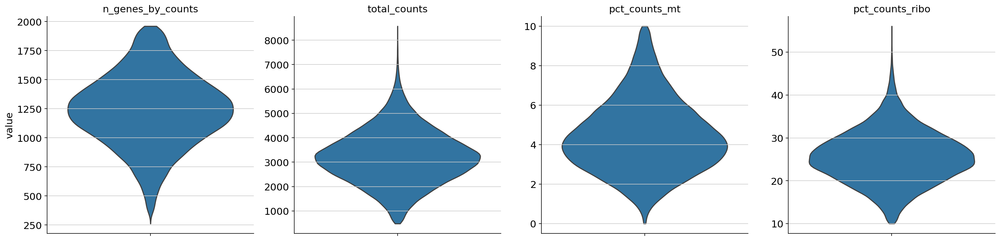

In [ ]:
sc.pl.violin(concatenated_ad, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], 
             multi_panel=True, stripplot=False)

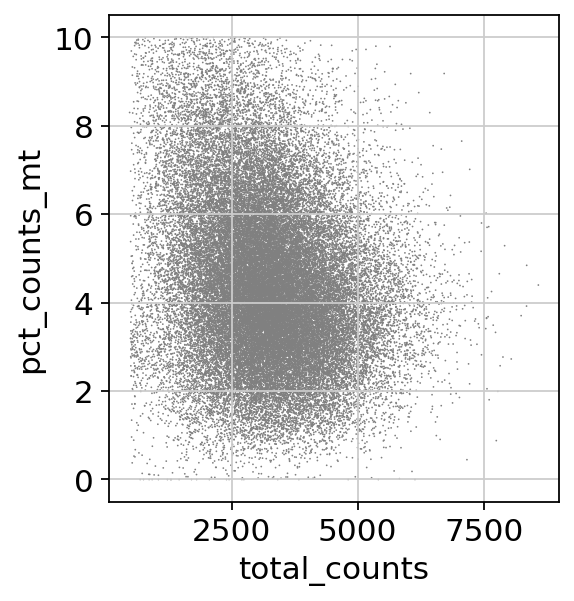

In [ ]:
sc.pl.scatter(concatenated_ad, x='total_counts', y='pct_counts_mt')

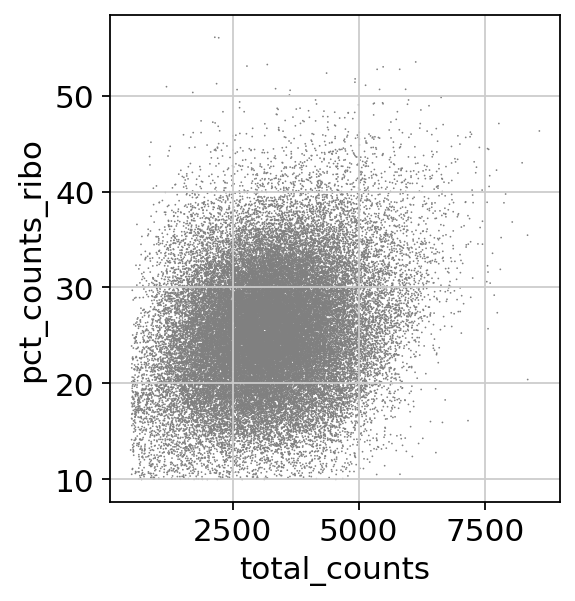

In [ ]:
sc.pl.scatter(concatenated_ad, x='total_counts', y='pct_counts_ribo')

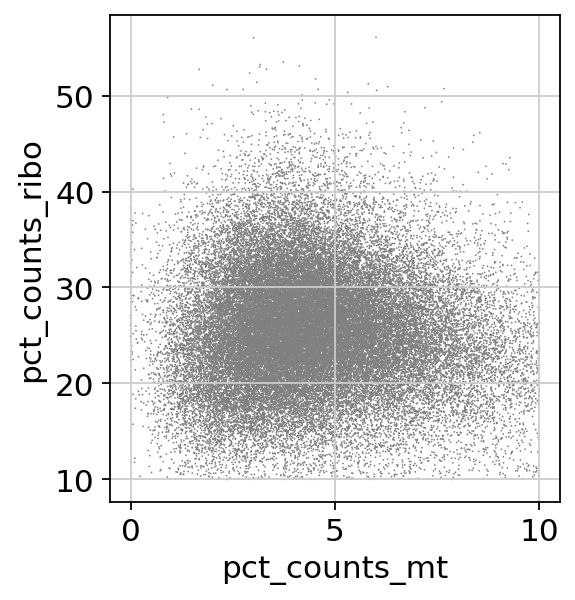

In [ ]:
sc.pl.scatter(concatenated_ad, x='pct_counts_mt', y='pct_counts_ribo')

**Remove certain genes from investigation**

Mitochondrial genes (annotated with the prefix ‘MT-’), high abundance lincRNA genes, genes linked with poorly supported transcriptional models (annotated with the prefix ‘RP-’) and TCR (TR) genes (TRA/TRB/TRD/TRG, to avoid clonotype bias) were removed from further analysis. 

In [ ]:
concatenated_ad

AnnData object with n_obs × n_vars = 48789 × 33538
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [ ]:
mito_genes = concatenated_ad.var_names.str.startswith('MT-')
unique, counts = np.unique(mito_genes, return_counts=True)
print(dict(zip(unique, counts)))
rp_genes = concatenated_ad.var_names.str.contains('RP-')
unique, counts = np.unique(rp_genes, return_counts=True)
print(dict(zip(unique, counts)))
tcr_genes = concatenated_ad.var_names.str.contains("TCR" or "TRA" or "TRB" or "TRD" or "TRG")
unique, counts = np.unique(tcr_genes, return_counts=True)
print(dict(zip(unique, counts)))
remove = np.add(mito_genes, rp_genes)
remove = np.add(remove, tcr_genes)
keep = np.invert(remove)
unique, counts = np.unique(keep, return_counts=True)
print(dict(zip(unique, counts)))

concatenated_ad = concatenated_ad[:, keep]


{False: 33525, True: 13}
{False: 33537, True: 1}
{False: 33537, True: 1}
{False: 15, True: 33523}


In [ ]:
concatenated_ad

View of AnnData object with n_obs × n_vars = 48789 × 33523
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

**Gene filtration based on the number of cells expressing them**

Genes that were expressed in less than five cells were excluded

In [ ]:
sc.pp.filter_genes(concatenated_ad, min_cells=5)

filtered out 15214 genes that are detected in less than 5 cells


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [ ]:
concatenated_ad

AnnData object with n_obs × n_vars = 48789 × 18309
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

## Single-cell data integration and clustering

Scanpy was used to normalize the raw count data, identify highly variable features, scale features, and integrate samples. PCA was performed based on the 3,000 most variable features identified using the vst method implemented in Seurat. Gene features associated with type I Interferon (IFN) response, immunoglobulin genes and specific mitochondrial related genes were excluded from clustering to avoid cell subsets driven by the above genes. Dimension reduction was done using the RunUMAP function. Cell markers were identified by using a two-sided Wilcoxon rank sum test. Genes with adjusted p<0.05 were retained. Clusters were labelled based on the expression of the top differential gene in each cluster as well as canonical immune cell markers.

**Total-count normalize** (library-size correct) the data matrix  X  to 10,000 reads per cell, so that counts become comparable among cells.

In [ ]:
sc.pp.normalize_total(concatenated_ad, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


Logarithmize the data:

In [ ]:
sc.pp.log1p(concatenated_ad)

Identify highly-variable genes

In [ ]:
sc.pp.highly_variable_genes(concatenated_ad, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


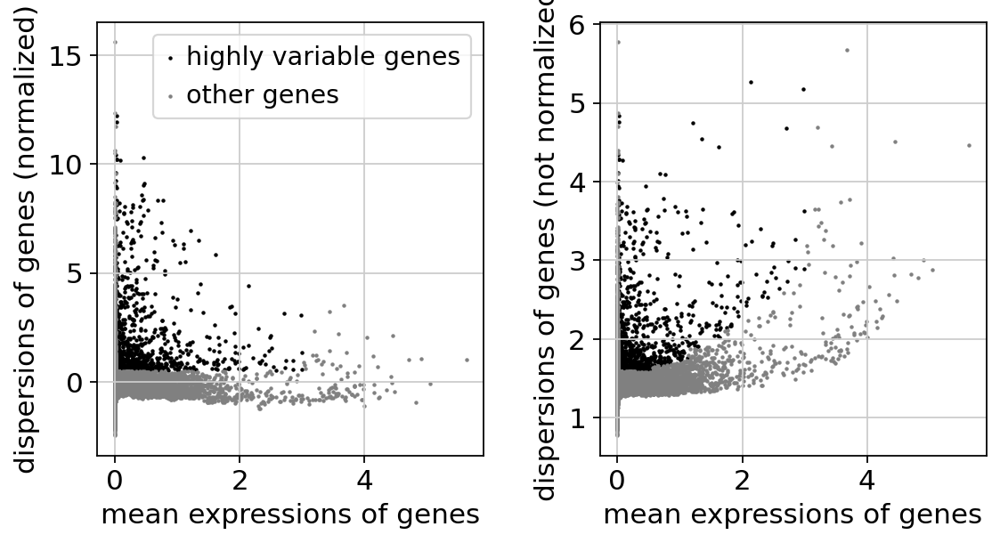

In [ ]:
sc.pl.highly_variable_genes(concatenated_ad)

Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.

In [ ]:
concatenated_ad.raw = concatenated_ad


The result of the previous highly-variable-genes detection is stored as an annotation in .var.highly_variable and auto-detected by PCA and hence, sc.pp.neighbors and subsequent manifold/graph tools. In that case, the step actually do the filtering below is unnecessary, too.

Actually do the filtering:

In [ ]:
concatenated_ad = concatenated_ad[:, concatenated_ad.var.highly_variable]


Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [ ]:
sc.pp.regress_out(concatenated_ad, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:01:35)


Scale each gene to unit variance. Clip values exceeding standard deviation 10

In [ ]:
sc.pp.scale(concatenated_ad, max_value=10)

### Principal component analysis

Gene features associated with type I Interferon (IFN) response and immunoglobulin genes were excluded from clustering to avoid cell subsets driven by the above genes.

In [ ]:
ig_genes = concatenated_ad.var_names.str.startswith('IG')
inf_genes = concatenated_ad.var_names.str.startswith('INF')
unique, counts = np.unique(ig_genes, return_counts=True)
print(dict(zip(unique, counts)))
unique, counts = np.unique(inf_genes, return_counts=True)
print(dict(zip(unique, counts)))

remove = np.add(ig_genes, inf_genes)
keep = np.invert(remove)

concatenated_ad = concatenated_ad[:,keep]

{False: 958, True: 12}
{False: 970}


In [ ]:
concatenated_ad.var_names

Index(['HES4', 'ISG15', 'TNFRSF18', 'TNFRSF4', 'TNFRSF9', 'AL450998.2', 'C1QA',
       'C1QB', 'ID3', 'AL033528.2',
       ...
       'FP671120.3', 'FP236383.2', 'FP236383.3', 'MIR155HG', 'TIAM1', 'MRPS6',
       'SLC5A3', 'CBR3', 'MX1', 'S100B'],
      dtype='object', length=958)

In [ ]:
concatenated_ad

View of AnnData object with n_obs × n_vars = 48789 × 958
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [ ]:
sc.tl.pca(concatenated_ad, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:11)


We can make a scatter plot in the PCA coordinates, but we will not use that later on.

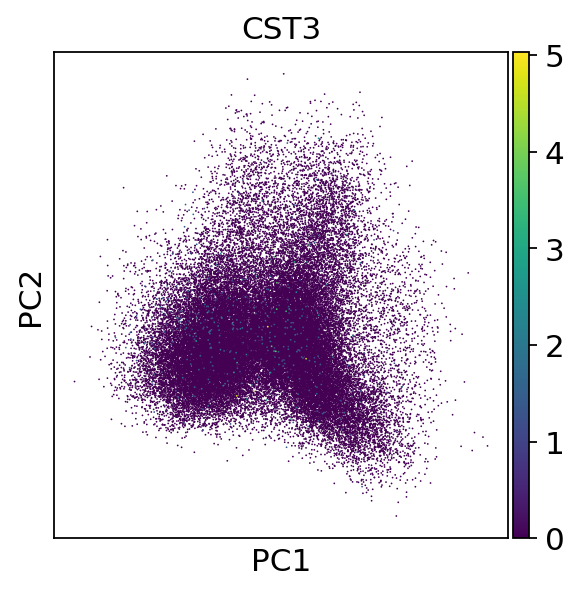

In [ ]:
sc.pl.pca(concatenated_ad, color='CST3')

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.louvain() or tSNE sc.tl.tsne(). Often a rough estimate of the number of PCs does fine.

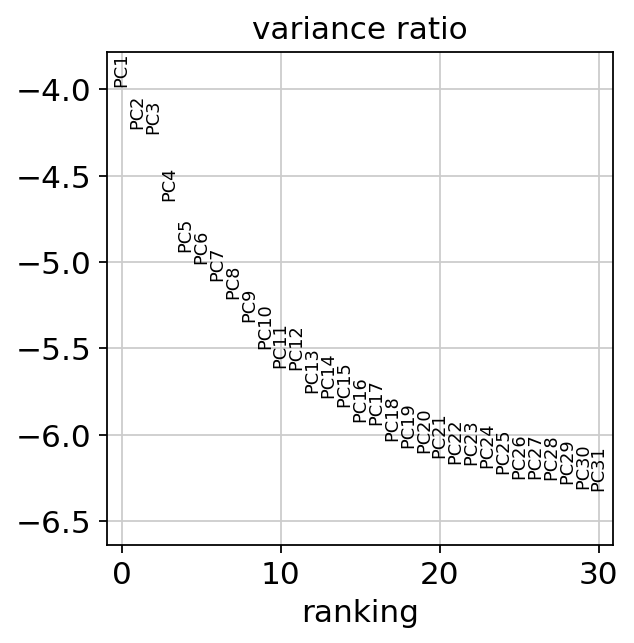

In [ ]:
sc.pl.pca_variance_ratio(concatenated_ad, log=True)

In [ ]:
# save results
results_file = f'results/results.h5ad'
concatenated_ad.write(results_file)

## Computing the neighborhood graph

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat's results, let's take the following values.

In [ ]:
sc.pp.neighbors(concatenated_ad, n_neighbors=15, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:36)


## Embedding the neighborhood graph

We suggest embedding the graph in two dimensions using UMAP ([McInnes et al., 2018](https://arxiv.org/abs/1802.03426)), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

```Python
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos='paga')
```

In [ ]:
sc.tl.umap(concatenated_ad)

# UMAP алгоритм машинного обучения, выполняющий нелинейное снижение размерности

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:46)


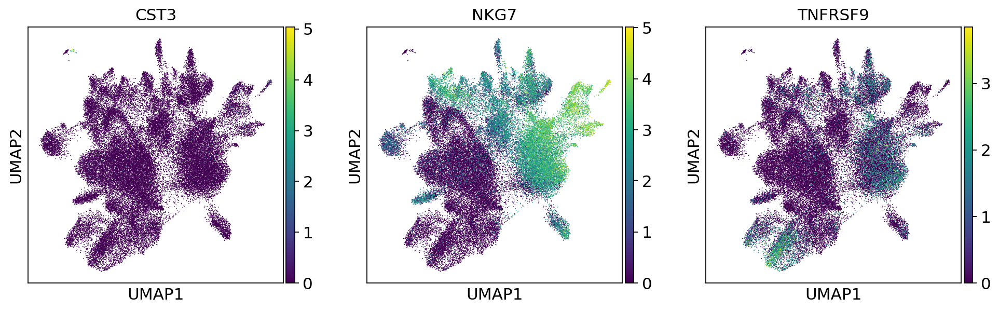

In [ ]:
sc.pl.umap(concatenated_ad, color=['CST3', 'NKG7', 'TNFRSF9'])

As we set the .raw attribute of adata, the previous plots showed the "raw" (normalized, logarithmized, but uncorrected) gene expression. You can also plot the scaled and corrected gene expression by explicitly stating that you don't want to use .raw.

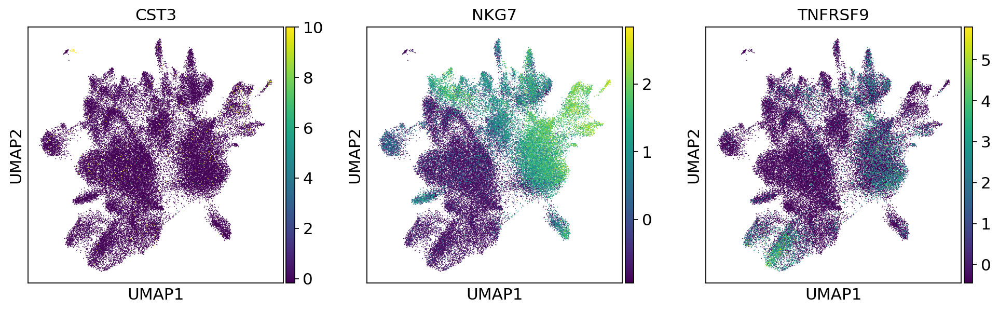

In [ ]:
sc.pl.umap(concatenated_ad, color=['CST3', 'NKG7', 'TNFRSF9'], use_raw=False)

## Clustering the neighborhood graph

As with Seurat and many other frameworks, we recommend the Leiden graph-clustering method (community detection based on optimizing modularity) by Traag et al. (2018). Note that Leiden clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

In [ ]:
!pip3 install leidenalg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 22.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 47.2 MB/s eta 0:00:00


In [ ]:
sc.tl.leiden(concatenated_ad)

running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:17)


From article:

marker_genes = ['CD8A', 'CD4', 'FOXP3', 'GZMK', 'CD103', 'HOBBIT', 'TCF7',
                'CXCL13', 'SLC4A10', 'PD1', 'CTLA4', 'TIM3', 'TIGIT', 'CD39', 'LAG3']

ZNF683=Hobit, SNCA=PD1, ITGAE=CD103, HAVCR2=TIM3, CD39 IS ABSENT

marker_genes = ['CD8A', 'CD4', 'FOXP3', 'GZMK', 'ITGAE', 'ZNF683', 'TCF7',
                'CXCL13', 'SLC4A10', 'SNCA', 'CTLA4', 'HAVCR2', 'TIGIT', 'LAG3']


Subset markers: CD8A, CD4, FOXP3; 
Subset-selective markers: GZMK, 'CD103', 'HOBBIT', 'TCF7', 'CXCL13', 'SLC4A10'; 
T-cell checkpoints: PD1.


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


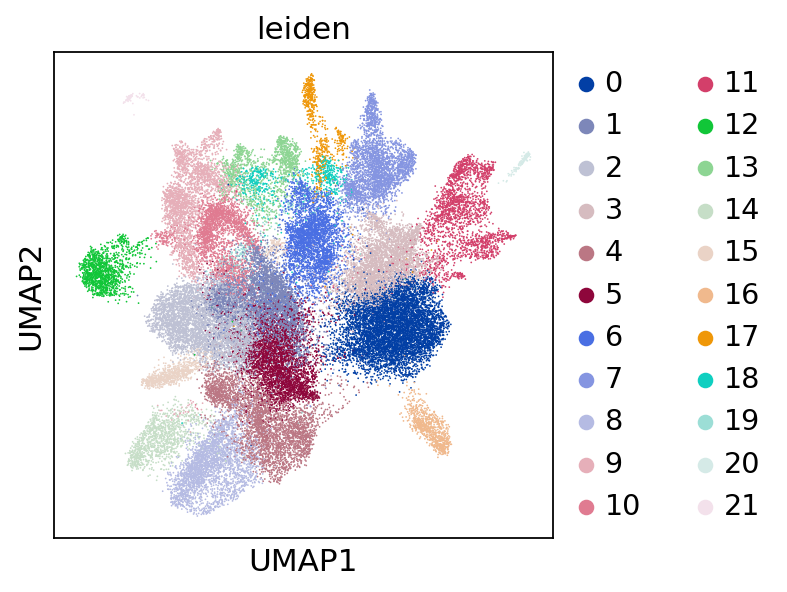

In [ ]:
sc.pl.umap(concatenated_ad, color=['leiden'], use_raw=True)

Relative intensity of expression of select genes superimposed on the UMAP projections in the plot with clusters

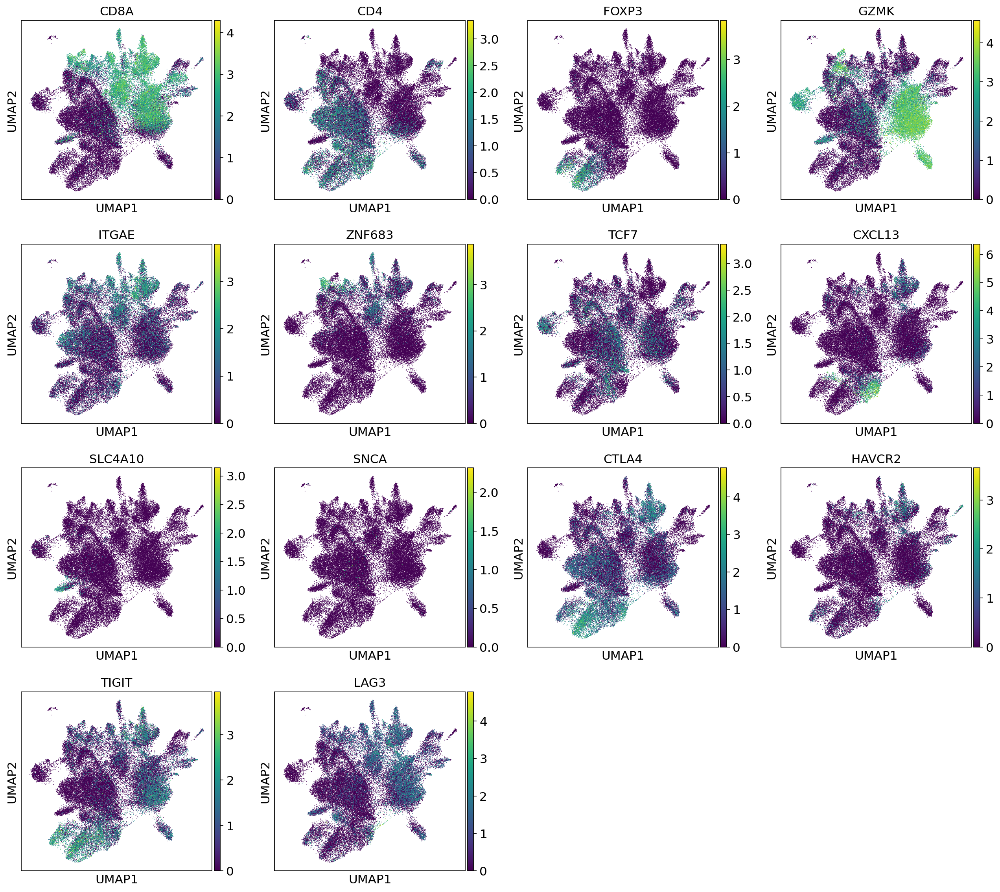

In [ ]:
# Check expression of marker genes for cluster annotation

# ZNF683=Hobit, SNCA=PD1, ITGAE=CD103, HAVCR2=TIM3
marker_genes = ['CD8A', 'CD4', 'FOXP3', 'GZMK', 'ITGAE', 'ZNF683', 'TCF7',
                'CXCL13', 'SLC4A10', 'SNCA', 'CTLA4', 'HAVCR2', 'TIGIT', 'LAG3']
sc.pl.umap(concatenated_ad, color=marker_genes, use_raw=True)


Save the result

In [ ]:
concatenated_ad.write(results_file)

## Finding marker genes

Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the .raw attribute of AnnData is used in case it has been initialized before. Use wilcoxon test (as in article).

Wilcoxon rank-sum (Mann-Whitney-U). It is recommended to use the latter in publications, see e.g., Sonison & Robinson (2018). Much more powerful differential testing packages like MAST, limma, DESeq2 and, for python, the recent diffxpy might also be considered.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:04:22)


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result

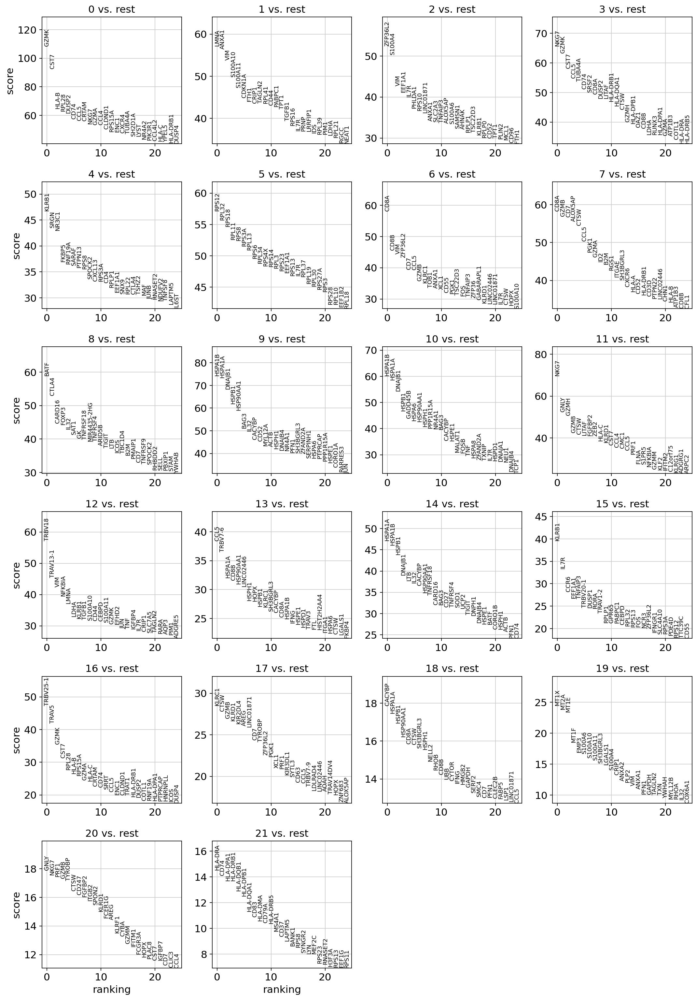

In [ ]:
sc.tl.rank_genes_groups(concatenated_ad, 'leiden', method='wilcoxon', use_raw=True)
sc.pl.rank_genes_groups(concatenated_ad, n_genes=25, sharey=False, use_raw=True)

In [ ]:
concatenated_ad.write(results_file)

DEFINED THE LIST OF MARKER GENES ABOVE (take from the article)

Show the 10 top ranked genes per cluster in a dataframe

In [ ]:
pd.DataFrame(concatenated_ad.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
0,GZMK,LMNA,ZFP36L2,NKG7,KLRB1,RPS12,CD8A,CD8A,BATF,HSPA1B,...,TRBV18,CCL5,HSPA1A,KLRB1,TRBV25-1,KLRC1,CACYBP,MT1X,GNLY,HLA-DRA
1,CST7,ANXA1,S100A4,GZMK,SRGN,RPL32,CD8B,GZMB,CTLA4,HSPA1A,...,TRAV13-1,TRBV7-6,HSPA1B,IL7R,TRAV5,CTSW,HSPA1A,MT2A,NKG7,CD74
2,HLA-B,VIM,VIM,CST7,NR3C1,RPS18,VIM,CD7,CARD16,DNAJB1,...,VIM,HSPA1A,HSPB1,CCR6,GZMK,GZMB,HSPB1,MT1E,PRF1,HLA-DPA1
3,RPL28,S100A10,EEF1A1,CCL5,FKBP5,RPL11,ZFP36L2,ALOX5AP,FOXP3,HSPB1,...,NFKBIA,CD8B,DNAJB1,EEF1A1,CST7,KLRD1,HSP90AA1,MT1F,GZMB,HLA-DRB1
4,DUSP2,S100A11,IL7R,TUBA4A,RNF19A,RPS8,CD7,CTSW,IL32,HSP90AA1,...,LMNA,HSP90AA1,LTB,TNFAIP3,RPL28,KIR2DL4,CD8A,EMP3,TYROBP,HLA-DQB1


Get a table with the scores and groups

In [ ]:
result = concatenated_ad.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,17_n,17_p,18_n,18_p,19_n,19_p,20_n,20_p,21_n,21_p
0,GZMK,0.0,LMNA,0.0,ZFP36L2,0.0,NKG7,0.0,KLRB1,0.000000e+00,...,KLRC1,6.151866e-179,CACYBP,1.994029e-71,MT1X,4.963113e-132,GNLY,1.478167e-71,HLA-DRA,1.159004e-47
1,CST7,0.0,ANXA1,0.0,S100A4,0.0,GZMK,0.0,SRGN,0.000000e+00,...,CTSW,2.207661e-170,HSPA1A,3.064937e-68,MT2A,2.171801e-125,NKG7,4.775993e-69,CD74,3.319223e-45
2,HLA-B,0.0,VIM,0.0,VIM,0.0,CST7,0.0,NR3C1,0.000000e+00,...,GZMB,3.790330e-160,HSPB1,2.217653e-64,MT1E,9.163431e-121,PRF1,3.385914e-68,HLA-DPA1,1.258241e-42
3,RPL28,0.0,S100A10,0.0,EEF1A1,0.0,CCL5,0.0,FKBP5,2.028652e-298,...,KLRD1,8.376952e-157,HSP90AA1,3.670034e-59,MT1F,1.958587e-76,GZMB,2.570588e-67,HLA-DRB1,1.422155e-42
4,DUSP2,0.0,S100A11,0.0,IL7R,0.0,TUBA4A,0.0,RNF19A,1.805416e-291,...,KIR2DL4,1.749886e-152,CD8A,1.247959e-56,EMP3,1.434011e-63,TYROBP,4.877087e-66,HLA-DQB1,4.960505e-38


Compare to a single cluster:

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


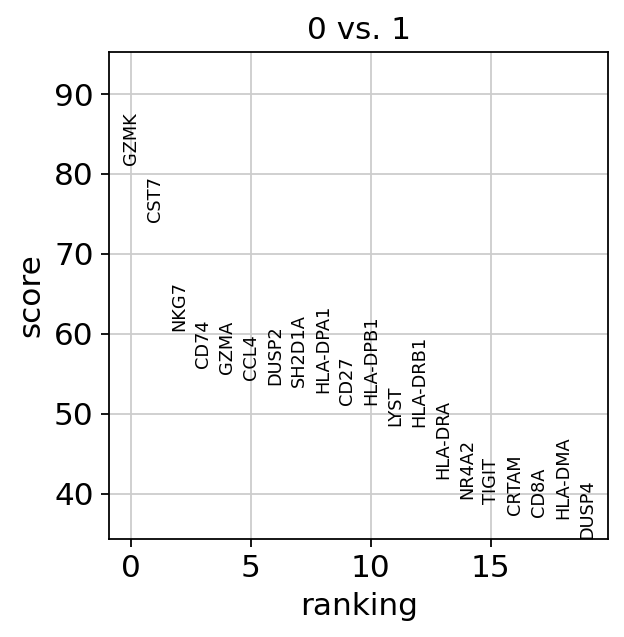

In [ ]:
sc.tl.rank_genes_groups(concatenated_ad, 'leiden', groups=['0'], reference='1', method='wilcoxon', use_raw=False)
sc.pl.rank_genes_groups(concatenated_ad, groups=['0'], n_genes=20, use_raw=False)

If we want a more detailed view for a certain group, use sc.pl.rank_genes_groups_violin

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


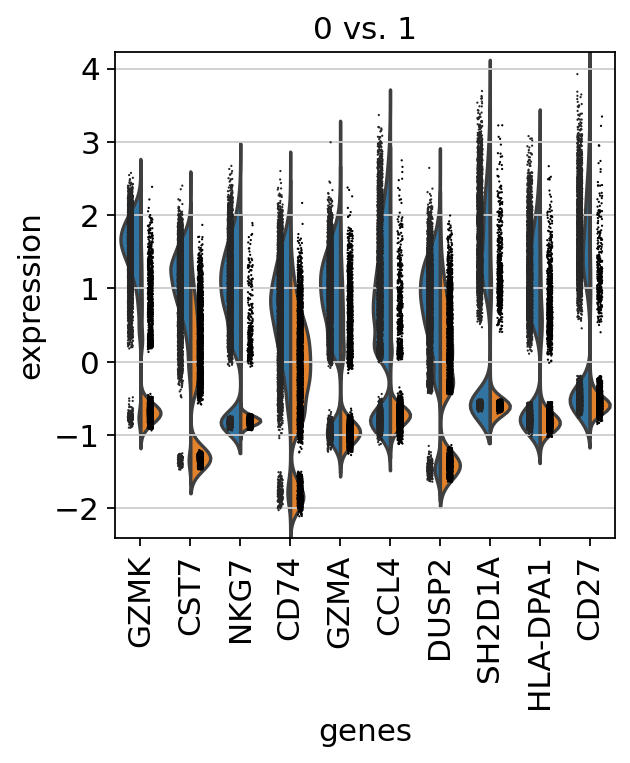

In [ ]:
sc.pl.rank_genes_groups_violin(concatenated_ad, groups='0', n_genes=10, use_raw=False)

Reload the object with the computed differential expression (i.e. DE via a comparison with the rest of the groups)

In [ ]:
adata = sc.read(results_file)

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


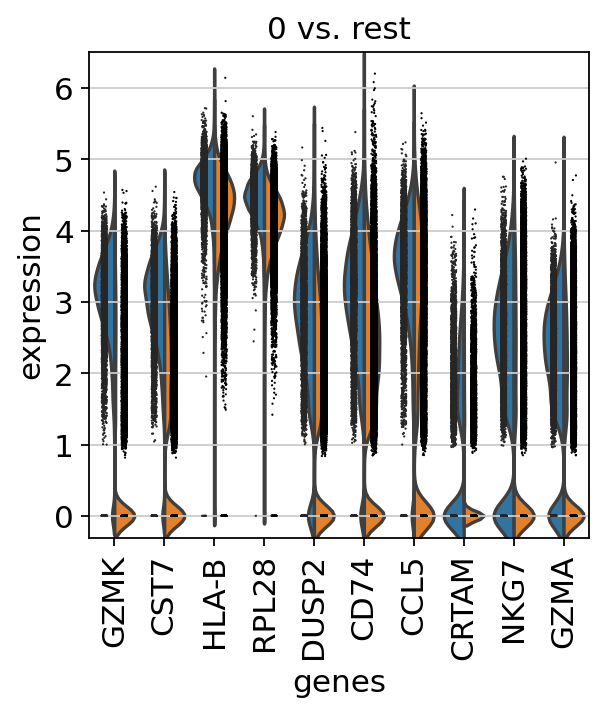

In [ ]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=10)

To compare a certain gene across groups, use the following:
~~~python
sc.pl.violin(adata, ['gene1', 'gene2'], groupby='leiden', use_raw=True)
~~~

Annotate clusters

In [ ]:
new_cluster_names = [
    'GZMK+TIGIT+LAG3+CTLA4+ Tc',
    'GZMK+ Tc', 
    'ITGAE+CTLA4+ Th', 
    'GZMK+LAG3+ Tc (1)', 
    'CXCL13+CTLA4+TIGIT+ Th', 
    'TCF7+CTLA4+GZMK+ Th', 
    'ITGAE+ZNF683+LAG3+ Tc', 
    'ITGAE+CXCL13+CTLA4+TIGIT+LAG3+ZNF683+HAVCR2+ Tc', 
    'CTLA4+TIGIT+FOXP3+ TReg (1)', 
    'GZMK+ITGAE+TCF7+ Th and GZMK+ITGAE+ZNF683+TIGIT+LAG3+ Tc (mixed cluster)', 
    'GZMK+TCF7+CTLA4+ Th', 
    'LAG3+ Tc', 
    'CD4-CD8-GZMK+TCF7+ T-cells', 
    'ITGAE+ZNF683+TIGIT+LAG3+ Tc',
    'CTLA4+TIGIT+FOXP3+ TReg (2)', 
    'GZMK+LAG3+ Tc (2)', 
    'GZMK+TIGIT+LAG3+CTLA4 Th', 
    'ITGAE+ZNF683+ Tc', 
    'CXCL13+CTLA4+HAVCR2+TIGIT+LAG3+ Tc', 
    'CTLA4+GZMK+TCF7+ Th', 
    'CD4-CD8-HAVCR2+ T-cells', 
    'Th']
adata.rename_categories('leiden', new_cluster_names)


Now that we annotated the cell types, let us visualize the marker genes

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


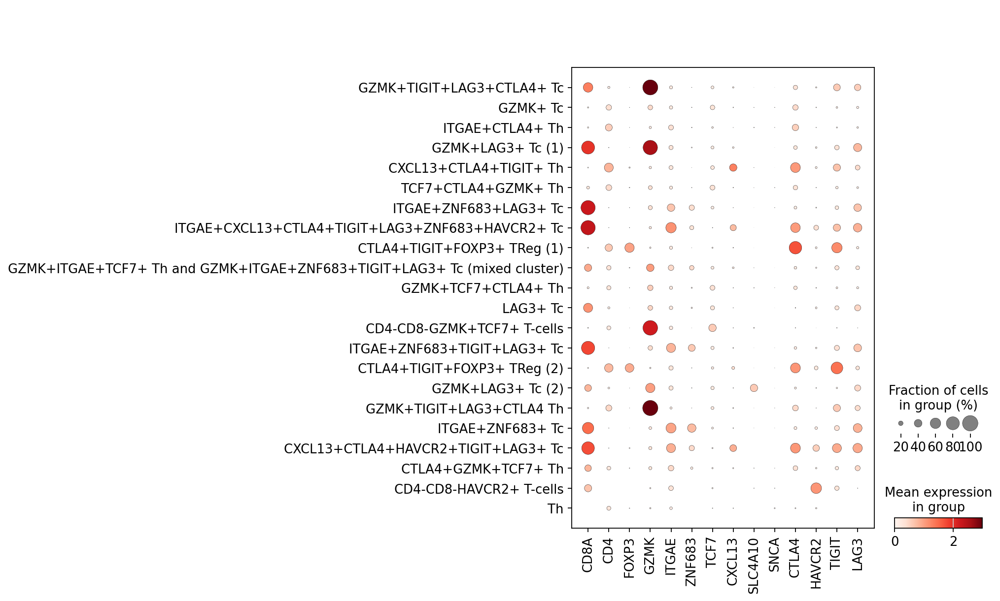

In [ ]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden');

Look at annotated clusters

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


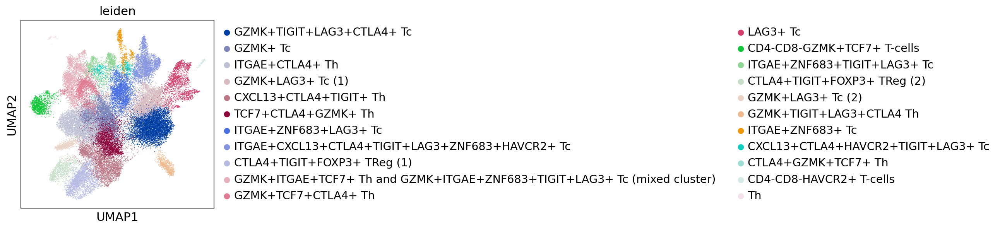

In [ ]:
sc.pl.umap(adata, color=['leiden'], use_raw=True, save='.pdf')


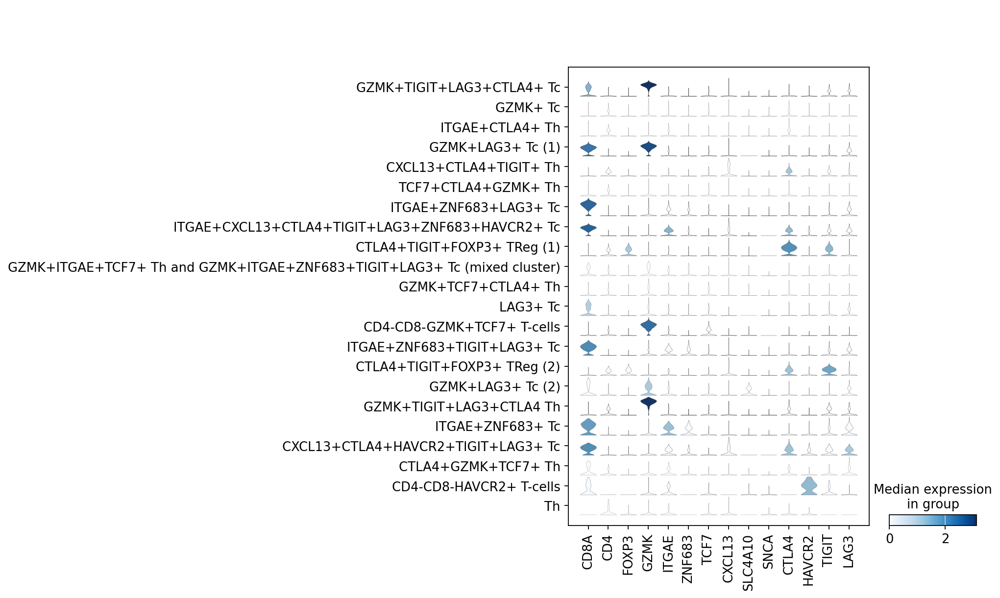

In [ ]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90);